In [57]:
import pandas as pd 

In [15]:
df = pd.read_csv('Sample - Superstore.csv' , encoding='latin1')
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,CA-2016-152156,11/8/2016,11/11/2016,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136
1,2,CA-2016-152156,11/8/2016,11/11/2016,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820
2,3,CA-2016-138688,6/12/2016,6/16/2016,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,...,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714
3,4,US-2015-108966,10/11/2015,10/18/2015,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
4,5,US-2015-108966,10/11/2015,10/18/2015,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164


In [59]:
def comprend_data(df):
    print("This is a data cleaning project.")

    print(f'shape of the data: {df.shape} \n')
    print(f"columns name \n\n: {df.columns} \n")


    print(f'diplicated rows {df.duplicated().sum()} \n')

    print(f'missing values in each column:\n {df.isna().sum()} \n')

    print(f'data types in the dataframe:\n {df.dtypes} \n')
    
comprend_data(df)

This is a data cleaning project.
shape of the data: (9994, 21) 

columns name 

: Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Customer Name', 'Segment', 'Country', 'City', 'State',
       'Postal Code', 'Region', 'Product ID', 'Category', 'Sub-Category',
       'Product Name', 'Sales', 'Quantity', 'Discount', 'Profit'],
      dtype='object') 

diplicated rows 0 

missing values in each column:
 Row ID           0
Order ID         0
Order Date       0
Ship Date        0
Ship Mode        0
Customer ID      0
Customer Name    0
Segment          0
Country          0
City             0
State            0
Postal Code      0
Region           0
Product ID       0
Category         0
Sub-Category     0
Product Name     0
Sales            0
Quantity         0
Discount         0
Profit           0
dtype: int64 

data types in the dataframe:
 Row ID             int64
Order ID          object
Order Date        object
Ship Date         object
Ship Mode 

In [16]:
df.columns

Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Customer Name', 'Segment', 'Country', 'City', 'State',
       'Postal Code', 'Region', 'Product ID', 'Category', 'Sub-Category',
       'Product Name', 'Sales', 'Quantity', 'Discount', 'Profit'],
      dtype='object')

In [61]:
df['Segment'].unique()

array(['Consumer', 'Corporate', 'Home Office'], dtype=object)

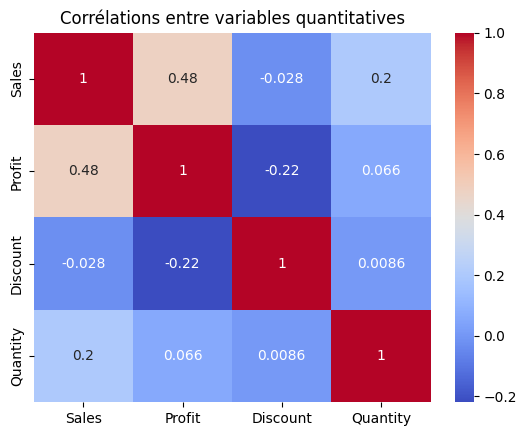

In [ ]:
corr = df[['Sales','Profit','Discount','Quantity']].corr()
sns.heatmap(corr, annot=True, cmap="coolwarm")
plt.title("Corrélations entre variables quantitatives")
plt.show()

Category  Furniture  Office Supplies  Technology
Region                                          
Central         481             1422         420
East            601             1712         535
South           332              995         293
West            707             1897         599


Text(0.5, 1.0, 'Tableau croisé Région x Catégorie')

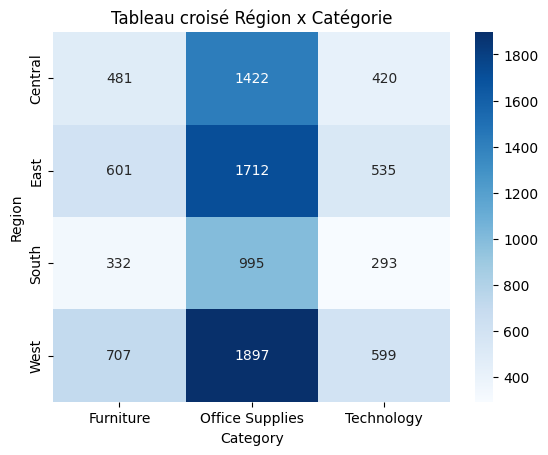

In [ ]:

import seaborn as sns
import matplotlib.pyplot as plt
cross_tab = pd.crosstab(df['Region'], df['Category']) 
print(cross_tab)
   
sns.heatmap(cross_tab, annot=True, fmt="d", cmap="Blues") 
plt.title("Tableau croisé Région x Catégorie") 

In [ ]:
# Moyenne du profit par segment
df.groupby('Segment')['Profit'].mean()




Segment
Consumer       25.836873
Corporate      30.456667
Home Office    33.818664
Name: Profit, dtype: float64

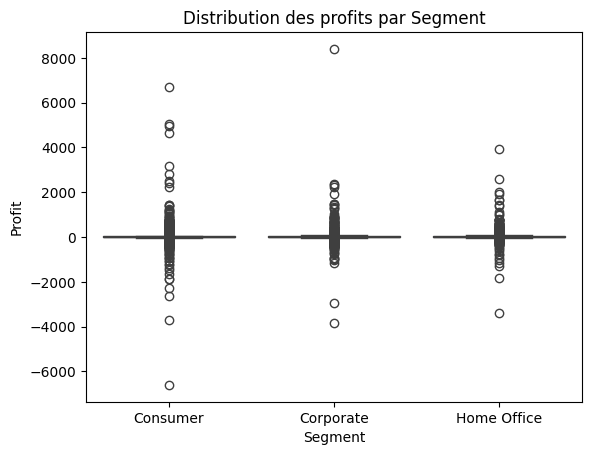

In [ ]:

sns.boxplot(x="Segment", y="Profit", data=df)
plt.title("Distribution des profits par Segment")
plt.show()
plt


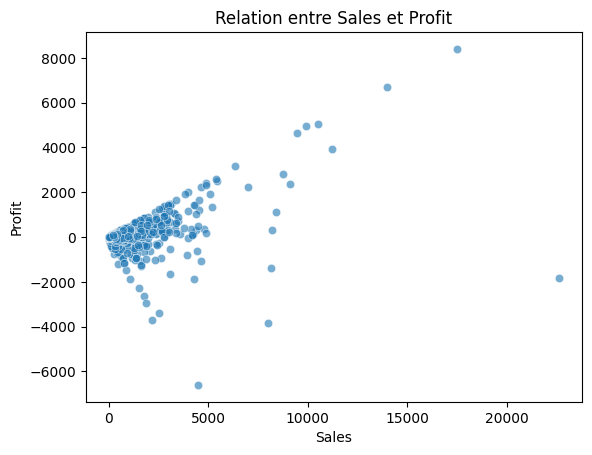

In [ ]:
sns.scatterplot(x="Sales", y="Profit", data=df, alpha=0.6)
plt.title("Relation entre Sales et Profit")
plt.show()


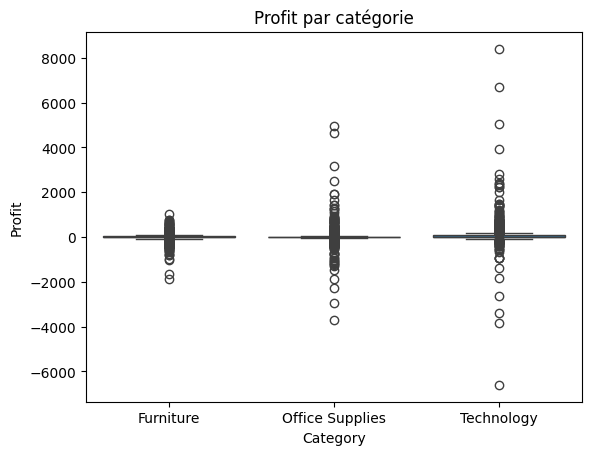

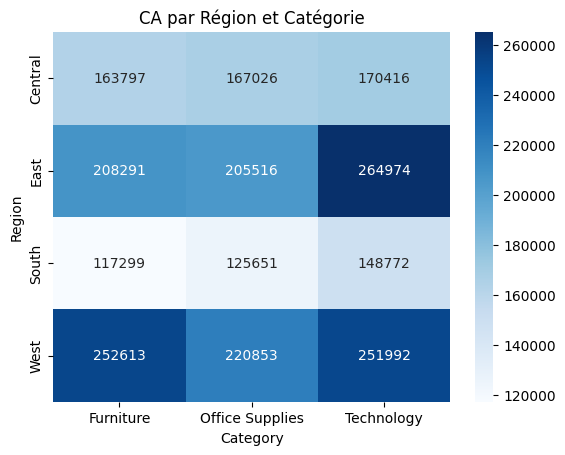

In [ ]:
sns.boxplot(x="Category", y="Profit", data=df)
plt.title("Profit par catégorie")
plt.show()

cross_tab = pd.crosstab(df['Region'], df['Category'], values=df['Sales'], aggfunc='sum')
sns.heatmap(cross_tab, annot=True, fmt=".0f", cmap="Blues")
plt.title("CA par Région et Catégorie")
plt.show()



Total Sales: 2297200.8603
Total Profit: 286397.02
Profit Margin: 12.47%
------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------
--------------------------------------Top 10 Produits par CA------------------------------------------


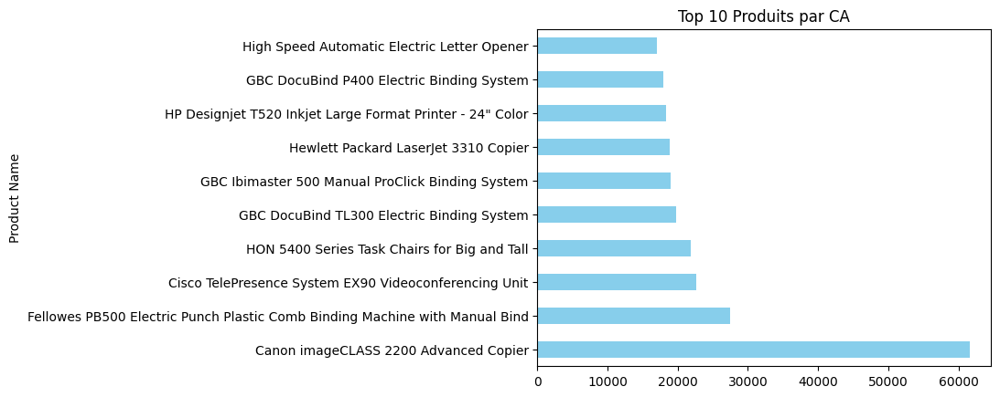

In [ ]:
total_sales = df['Sales'].sum()
print(f'Total Sales: {total_sales}')
profit_total= df['Profit'].sum()
print(f'Total Profit: {profit_total:.2f}')
#calculer le profit margin des produits 
profit_margin = (profit_total / total_sales) * 100
print(f'Profit Margin: {profit_margin:.2f}%')
print("------------------------------------------------------------------------------------------------------")
print("------------------------------------------------------------------------------------------------------")
print("--------------------------------------Top 10 Produits par CA------------------------------------------")

df.groupby('Product Name')['Sales'].sum().sort_values(ascending=False).head(10).plot(kind='barh', color='skyblue')
plt.title("Top 10 Produits par CA")
plt.show()

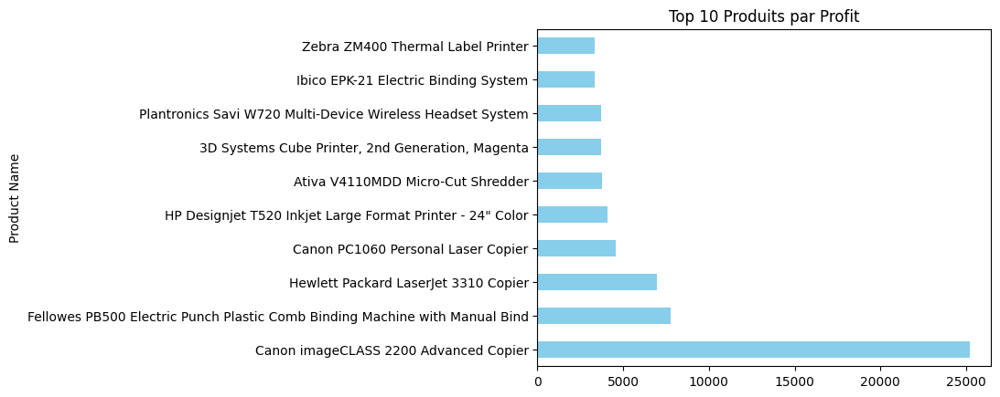

In [73]:
top_products = df.groupby('Product Name')['Profit'].sum().sort_values(ascending=False).head(10)
top_products.plot(kind='barh', color='skyblue')
plt.title("Top 10 Produits par Profit")
plt.show()


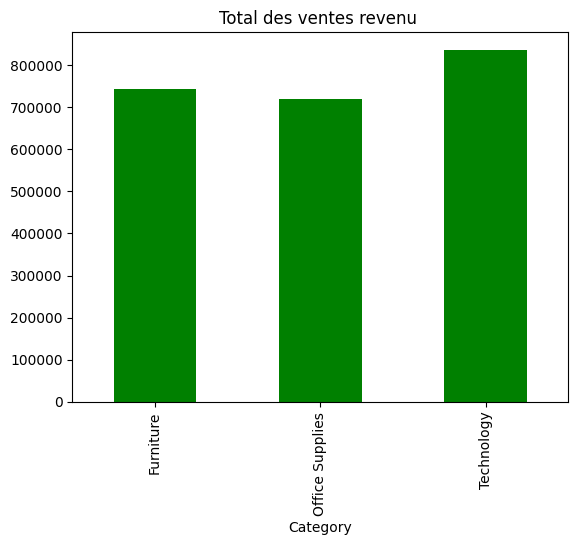

In [ ]:
df.head()
df.groupby('Category')['Sales'].sum().plot(kind='bar', color='green')
plt.title("Total des ventes par catégorie") 
plt.title("Total des ventes revenu ")
plt.show()


In [23]:
df.columns

Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Customer Name', 'Segment', 'Country', 'City', 'State',
       'Postal Code', 'Region', 'Product ID', 'Category', 'Sub-Category',
       'Product Name', 'Sales', 'Quantity', 'Discount', 'Profit',
       'Discount_Impact'],
      dtype='object')

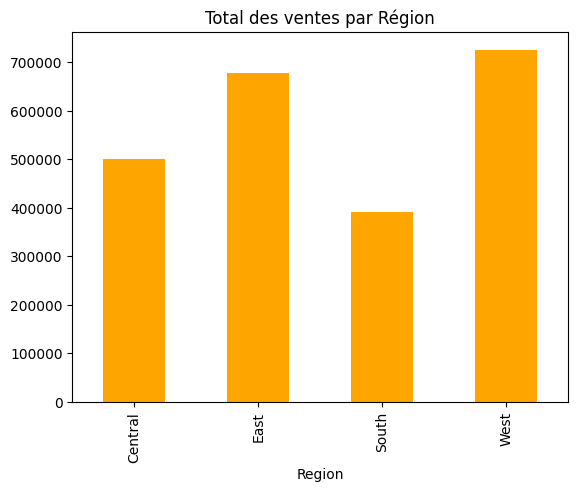

In [ ]:
df.groupby('Region')['Sales'].sum().plot(kind='bar', color='orange')
plt.title("Total des ventes par  Région")
plt.show() 

project2

In [1]:
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [11]:
with open("C:\\Users\\hp\\Documents\\web_scraping project\\importing_data\\augesc_processed.json", "r", encoding="utf-8") as f:
    data = json.load(f)
print(data)

{'conversations': [{'dialogue': [['usr', 'My upstairs neighbors make a ton of noise at all hours of the night. It makes it difficult for me to sleep.'], ['sys', "Ah, I understand, there's more noise in your area than in other parts of the world?"], ['usr', "I'm not sure if they're directly in my room, but it feels like it."], ['sys', 'What sort of noise do you hear? Do you feel that its necessary to live in close proximity to them?'], ['usr', 'They have what sounds like parties, loud music playing, someone flushing a toilet at 3am, slamming doors, and shouting loudly.'], ['sys', 'I can see how it may be difficult to sleep at night with that type of activity going on. What is the relationship between your neighbors and you?'], ['usr', "The only thing I've found that helps a little is having the door closed, but that only works for a short time before they walk in."], ['sys', 'Have you tried asking them to turn their music down, or complaining to your landlord?'], ['usr', "I've complaine

Shape final : (131930, 8)

Types de données :
conversation_id     int64
turn_index          int64
speaker            object
message            object
message_length      int64
is_question          bool
strength            int32
is_valid_event       bool
dtype: object

Valeurs nulles :
conversation_id    0
turn_index         0
speaker            0
message            0
message_length     0
is_question        0
strength           0
is_valid_event     0
dtype: int64

Répartition speaker :
speaker
sys    67458
usr    64472
Name: count, dtype: int64

Nombre total de messages : 131930

Répartition par speaker (%) :
speaker
sys    51.131661
usr    48.868339
Name: proportion, dtype: float64

Statistiques strength :
count    131930.000000
mean          3.002971
std           1.415619
min           1.000000
25%           2.000000
50%           3.000000
75%           4.000000
max           5.000000
Name: strength, dtype: float64

Statistiques longueur message :
count    131930.000000
mean         

C:\Users\hp\AppData\Local\Temp\ipykernel_15152\263007233.py:123: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df_clean.groupby("length_group")["strength"].mean())


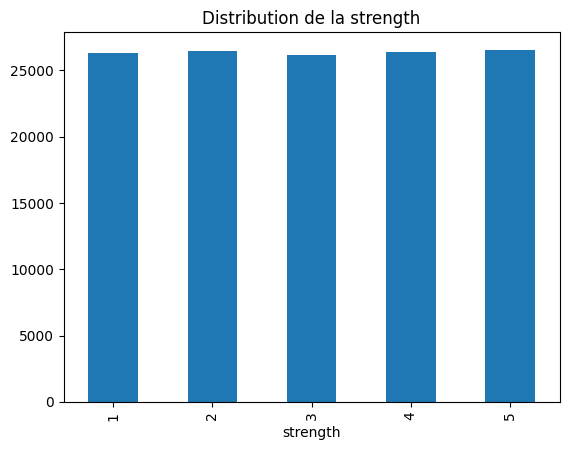

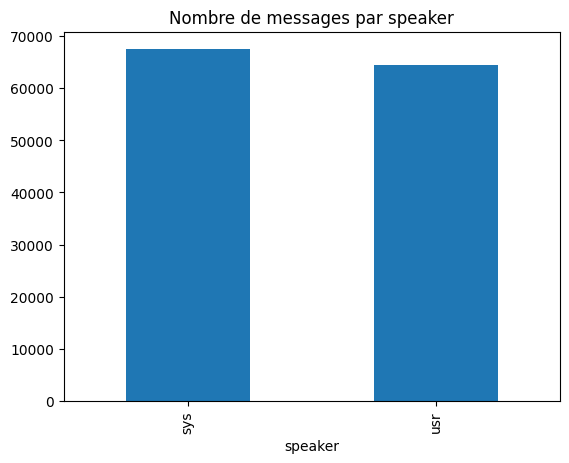

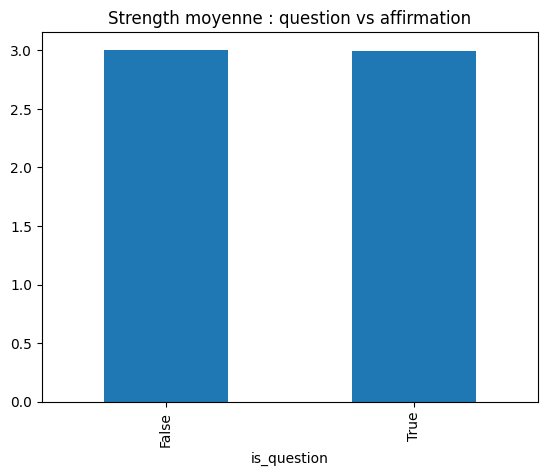

C:\Users\hp\AppData\Local\Temp\ipykernel_15152\263007233.py:145: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_clean.groupby("length_group")["strength"].mean().plot(kind="bar")


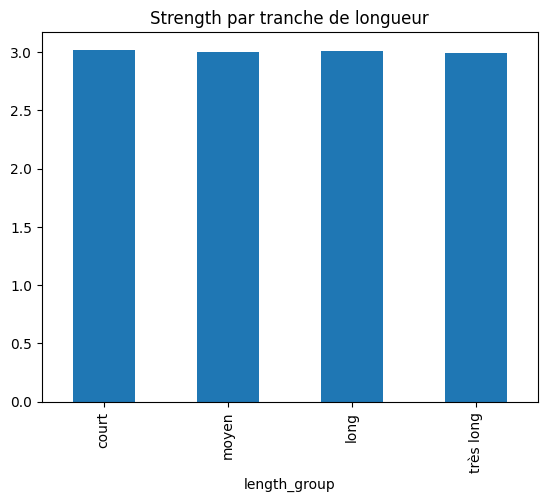


✅ Export terminé : augesc_events_clean.csv


In [12]:
# =========================================================
# PROJET DATA ANALYST — AUGESC
# Analyse de données conversationnelles
# JSON → Pandas → CSV (Power BI)
# =========================================================

# -------------------------
# 0. IMPORTS
# -------------------------
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# -------------------------
# 1. CHARGEMENT DU JSON BRUT
# -------------------------
with open("C:\\Users\\hp\\Documents\\web_scraping project\\importing_data\\augesc_processed.json", "r", encoding="utf-8") as f:
    data = json.load(f)

# -------------------------
# 2. TRANSFORMATION JSON → TABLE
# 1 ligne = 1 message
# -------------------------
rows = []

for conv_id, conv in enumerate(data["conversations"]):
    dialogue = conv.get("dialogue", [])
    
    for turn_index, turn in enumerate(dialogue):
        if len(turn) >= 2:
            speaker = turn[0]
            message = turn[1]
            
            rows.append({
                "conversation_id": conv_id,
                "turn_index": turn_index,
                "speaker": speaker,
                "message": message
            })

df = pd.DataFrame(rows)

# -------------------------
# 3. ENRICHISSEMENT DES DONNÉES
# -------------------------

# Longueur du message
df["message_length"] = df["message"].astype(str).str.len()

# Détection des questions
df["is_question"] = df["message"].astype(str).str.strip().str.endswith("?")

# Strength simulée (pédagogique)
df["strength"] = np.random.randint(1, 6, size=len(df))

# Flag qualité
df["is_valid_event"] = (
    df["message"].notna() &
    (df["message_length"] > 3) &
    df["speaker"].isin(["usr", "sys"])
)

# -------------------------
# 4. NETTOYAGE FINAL
# -------------------------
df_clean = df[df["is_valid_event"]].copy()

# -------------------------
# 5. CONTRÔLES QUALITÉ
# -------------------------
print("Shape final :", df_clean.shape)
print("\nTypes de données :")
print(df_clean.dtypes)
print("\nValeurs nulles :")
print(df_clean.isnull().sum())
print("\nRépartition speaker :")
print(df_clean["speaker"].value_counts())

# =========================================================
# ÉTAPE 3 — ANALYSE DES DONNÉES
# =========================================================

# Q1 — Volume
print("\nNombre total de messages :", df_clean.shape[0])

# Q2 — Répartition speaker
print("\nRépartition par speaker (%) :")
print(df_clean["speaker"].value_counts(normalize=True) * 100)

# Q3 — Distribution strength
print("\nStatistiques strength :")
print(df_clean["strength"].describe())

# Q4 — Longueur des messages
print("\nStatistiques longueur message :")
print(df_clean["message_length"].describe())

# Q5 — Question vs affirmation
print("\nStrength moyenne (question vs non-question) :")
print(df_clean.groupby("is_question")["strength"].mean())

# Q6 — Speaker × Question
print("\nSpeaker × Question (strength moyenne) :")
print(df_clean.groupby(["speaker", "is_question"])["strength"].mean())

# Q7 — Outliers (IQR)
q1 = df_clean["message_length"].quantile(0.25)
q3 = df_clean["message_length"].quantile(0.75)
iqr = q3 - q1

outliers = df_clean[df_clean["message_length"] > q3 + 1.5 * iqr]
print("\nNombre de messages atypiques :", outliers.shape[0])

# Q8 — Segmentation par longueur
df_clean["length_group"] = pd.cut(
    df_clean["message_length"],
    bins=[0, 20, 50, 100, 500],
    labels=["court", "moyen", "long", "très long"]
)

print("\nStrength moyenne par tranche de longueur :")
print(df_clean.groupby("length_group")["strength"].mean())

# =========================================================
# VISUALISATIONS (MAX 4)
# =========================================================

# 1. Distribution de strength
df_clean["strength"].value_counts().sort_index().plot(kind="bar")
plt.title("Distribution de la strength")
plt.show()

# 2. Messages par speaker
df_clean["speaker"].value_counts().plot(kind="bar")
plt.title("Nombre de messages par speaker")
plt.show()

# 3. Question vs Non-question
df_clean.groupby("is_question")["strength"].mean().plot(kind="bar")
plt.title("Strength moyenne : question vs affirmation")
plt.show()

# 4. Strength par tranche de longueur
df_clean.groupby("length_group")["strength"].mean().plot(kind="bar")
plt.title("Strength par tranche de longueur")
plt.show()

# =========================================================
# EXPORT FINAL POUR POWER BI
# =========================================================
df_clean.to_csv("augesc_events_clean.csv", index=False)

print("\n✅ Export terminé : augesc_events_clean.csv")


In [4]:
df= pd.read_csv('augesc_events_clean.csv')
df.head()

,conversation_id,turn_index,speaker,message,message_length,is_question,strength,is_valid_event,length_group
0,0,0,usr,My upstairs neighbors make a ton of noise at a...,107,False,3,True,très long
1,0,1,sys,"Ah, I understand, there's more noise in your a...",83,True,2,True,long
2,0,2,usr,"I'm not sure if they're directly in my room, b...",66,False,5,True,long
3,0,3,sys,What sort of noise do you hear? Do you feel th...,98,True,4,True,long
4,0,4,usr,"They have what sounds like parties, loud music...",126,False,1,True,très long


In [2]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
import pandas as pd

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression


In [ ]:
# =========================================================
# PROJET AUGESC — ML RANDOM FOREST AMÉLIORÉ
# =========================================================

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score

# -------------------------
# 1. Chargement du dataset
# -------------------------
df = pd.read_csv("augesc_events_clean.csv")  # ton fichier propre
# Exemple de colonnes attendues :
# 'conversation_id', 'turn_index', 'speaker', 'message',
# 'message_length', 'is_question', 'strength', 'is_valid_event', 'length_group'

# -------------------------
# 2. Création de la cible binaire
# -------------------------
median_strength = df["strength"].median()
df["strength_binary"] = (df["strength"] >= median_strength).astype(int)

# -------------------------
# 3. Features dérivées
# -------------------------
# Nombre de mots
df["word_count"] = df["message"].astype(str).str.split().apply(len)

# Interaction speaker × is_question
df["usr_question"] = ((df["speaker"] == "usr") & (df["is_question"] == True)).astype(int)

# -------------------------
# 4. Variables finales pour le modèle
# -------------------------
# One-hot encoding des variables catégorielles
df_model = pd.get_dummies(df[["speaker", "is_question", "length_group"]], drop_first=True)

# Ajouter les variables numériques
df_model["message_length"] = df["message_length"]
df_model["word_count"] = df["word_count"]
df_model["usr_question"] = df["usr_question"]

# Standardisation de message_length et word_count
scaler = StandardScaler()
df_model[["message_length", "word_count"]] = scaler.fit_transform(df_model[["message_length", "word_count"]])

# Target
y = df["strength_binary"]
X = df_model.copy()

# -------------------------
# 5. Split train/test
# -------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# -------------------------
# 6. Modèle Random Forest
# -------------------------
model = RandomForestClassifier(
    n_estimators=200,
    random_state=42,
    class_weight='balanced'
)
model.fit(X_train, y_train)

# -------------------------
# 7. Prédictions
# -------------------------
y_pred = model.predict(X_test)
y_proba = model.predict_proba(X_test)[:, 1]

# -------------------------
# 8. Évaluation
# -------------------------
print("=== Classification Report ===")
print(classification_report(y_test, y_pred))

print("=== Matrice de confusion ===")
print(confusion_matrix(y_test, y_pred))

auc = roc_auc_score(y_test, y_proba)
print(f"AUC: {auc:.3f}")

# -------------------------
# 9. Importance des variables
# -------------------------
importances = pd.DataFrame({
    "feature": X.columns,
    "importance": model.feature_importances_
}).sort_values(by="importance", ascending=False)

print("\nImportance des variables :")
print(importances)


=== Classification Report ===
              precision    recall  f1-score   support

           0       0.40      0.49      0.44     10557
           1       0.60      0.51      0.55     15829

    accuracy                           0.50     26386
   macro avg       0.50      0.50      0.50     26386
weighted avg       0.52      0.50      0.51     26386

=== Matrice de confusion ===
[[5175 5382]
 [7685 8144]]
AUC: 0.503

Importance des variables :
                  feature  importance
5          message_length    0.714893
6              word_count    0.272986
1             speaker_usr    0.005428
0             is_question    0.004348
7            usr_question    0.000978
3      length_group_moyen    0.000554
2       length_group_long    0.000455
4  length_group_très long    0.000357


In [9]:
pip install scikit-learn xgboost scipy 

   ---------------------------------------- 0.0/72.0 MB ? eta -:--:--
   ---------------------------------------- 0.5/72.0 MB 2.8 MB/s eta 0:00:26
   ---------------------------------------- 0.8/72.0 MB 2.1 MB/s eta 0:00:34
   ---------------------------------------- 0.8/72.0 MB 2.1 MB/s eta 0:00:34
    --------------------------------------- 1.0/72.0 MB 1.0 MB/s eta 0:01:10
    --------------------------------------- 1.0/72.0 MB 1.0 MB/s eta 0:01:10
    --------------------------------------- 1.0/72.0 MB 1.0 MB/s eta 0:01:10
    --------------------------------------- 1.3/72.0 MB 729.7 kB/s eta 0:01:37
    --------------------------------------- 1.3/72.0 MB 729.7 kB/s eta 0:01:37
    --------------------------------------- 1.6/72.0 MB 711.2 kB/s eta 0:01:40
    --------------------------------------- 1.6/72.0 MB 711.2 kB/s eta 0:01:40
    --------------------------------------- 1.6/72.0 MB 711.2 kB/s eta 0:01:40
   - -------------------------------------- 1.8/72.0 MB 625.4 kB/s eta 0:


[notice] A new release of pip is available: 24.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [12]:
# =========================================================
# AUGESC — ML réaliste : prédiction de is_question
# =========================================================

import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from sklearn.feature_extraction.text import TfidfVectorizer

from xgboost import XGBClassifier
from scipy.sparse import hstack

# -------------------------
# 1. Chargement des données
# -------------------------
df = pd.read_csv("augesc_events_clean.csv")

# -------------------------
# 2. Target : is_question
# -------------------------
df["is_question_binary"] = df["is_question"].astype(int)
y = df["is_question_binary"].values

# -------------------------
# 3. Features numériques
# -------------------------
df["word_count"] = df["message"].astype(str).str.split().apply(len)
df["usr_question"] = ((df["speaker"]=="usr") & df["is_question"]).astype(int)  # interaction

scaler = StandardScaler()
df[["message_length_scaled","word_count_scaled"]] = scaler.fit_transform(df[["message_length","word_count"]])

# One-hot length_group
length_dummies = pd.get_dummies(df["length_group"], prefix="length_group", drop_first=True)

df_model_numeric = pd.concat([
    df[["message_length_scaled","word_count_scaled","usr_question"]].astype(float),
    length_dummies.astype(float)
], axis=1)

# -------------------------
# 4. TF-IDF sur le texte
# -------------------------
tfidf = TfidfVectorizer(
    max_features=1000,
    ngram_range=(1,2),
    stop_words="english"
)
X_text = tfidf.fit_transform(df["message"])

# -------------------------
# 5. Combiner TF-IDF + numeric
# -------------------------
X = hstack([X_text, df_model_numeric.values])

# -------------------------
# 6. Split train/test
# -------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# -------------------------
# 7. Modèle XGBoost
# -------------------------
pos_weight = np.sum(y_train==0)/np.sum(y_train==1)

model = XGBClassifier(
    n_estimators=200,
    max_depth=5,
    learning_rate=0.1,
    eval_metric='logloss',
    scale_pos_weight=pos_weight,
    random_state=42
)
model.fit(X_train, y_train)

# -------------------------
# 8. Prédictions
# -------------------------
y_pred = model.predict(X_test)
y_proba = model.predict_proba(X_test)[:,1]

# -------------------------
# 9. Évaluation
# -------------------------
print("=== Classification Report ===")
print(classification_report(y_test, y_pred))

print("=== Matrice de confusion ===")
print(confusion_matrix(y_test, y_pred))

auc = roc_auc_score(y_test, y_proba)
print(f"AUC: {auc:.3f}")

# -------------------------

# 10. Importance des features
# -------------------------
importances = model.feature_importances_
indices = np.argsort(importances)[::-1]

print("\nTop 10 features importantes :")
for i in range(10):
    print(f"{i+1}. {importances[indices[i]]:.4f} -> index {indices[i]}")

print("\n✅ Modèle XGBoost entraîné et évalué avec succès.")


=== Classification Report ===
              precision    recall  f1-score   support

           0       0.92      0.77      0.84     20185
           1       0.51      0.78      0.62      6201

    accuracy                           0.77     26386
   macro avg       0.71      0.78      0.73     26386
weighted avg       0.82      0.77      0.79     26386

=== Matrice de confusion ===
[[15496  4689]
 [ 1342  4859]]
AUC: 0.866

Top 10 features importantes :
1. 0.0900 -> index 1002
2. 0.0408 -> index 185
3. 0.0262 -> index 844
4. 0.0259 -> index 838
5. 0.0211 -> index 987
6. 0.0171 -> index 200
7. 0.0169 -> index 484
8. 0.0169 -> index 386
9. 0.0130 -> index 511
10. 0.0123 -> index 425


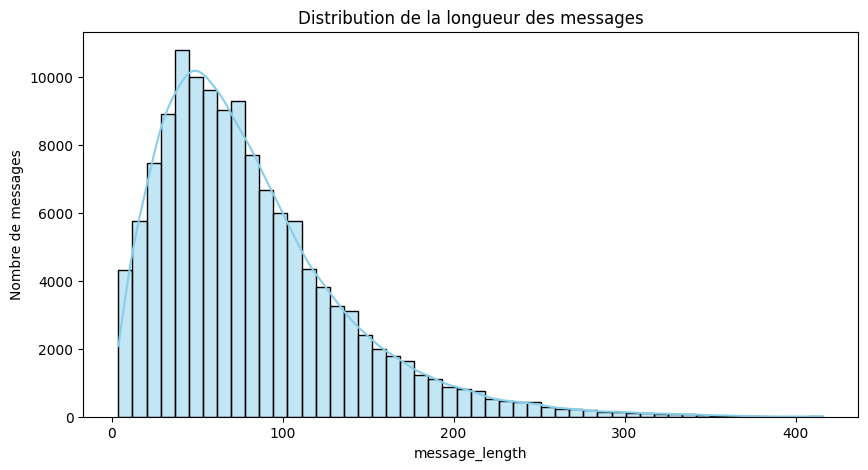

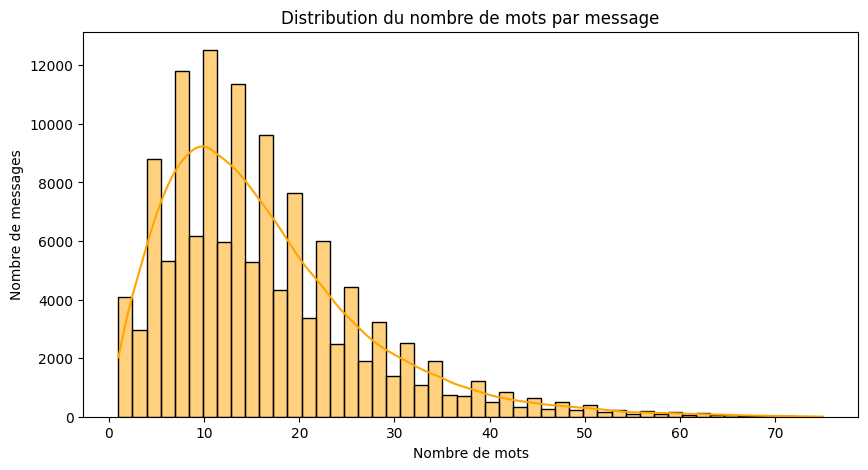

C:\Users\hp\AppData\Local\Temp\ipykernel_11188\3581342696.py:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='is_question', data=df, palette='viridis')


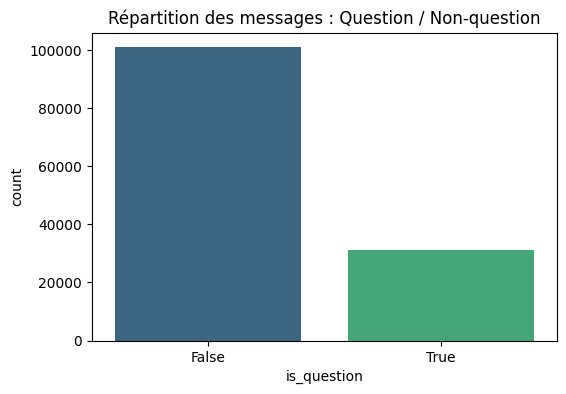

C:\Users\hp\AppData\Local\Temp\ipykernel_11188\3581342696.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='length_group', data=df, palette='magma')


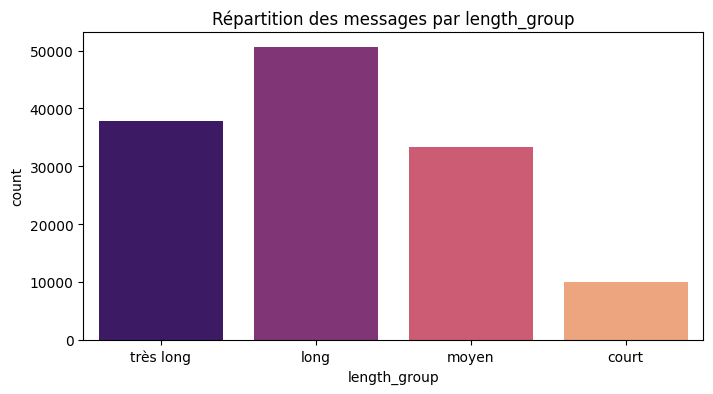

=== Classification Report ===
              precision    recall  f1-score   support

           0       0.92      0.77      0.84     20185
           1       0.51      0.78      0.62      6201

    accuracy                           0.77     26386
   macro avg       0.71      0.78      0.73     26386
weighted avg       0.82      0.77      0.79     26386

Matrice de confusion :
[[15496  4689]
 [ 1342  4859]]
AUC: 0.866


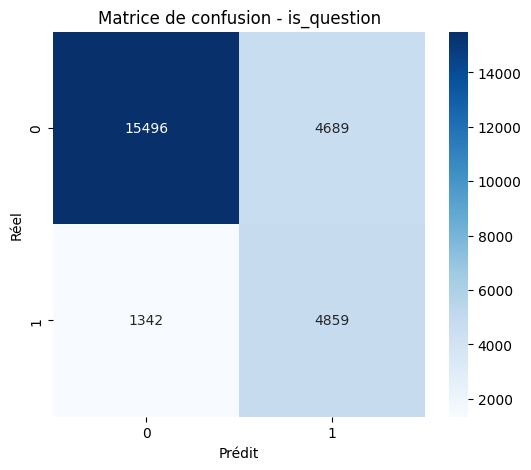


Top 10 features numériques importantes :
length_group_long -> 0.0010
length_group_moyen -> 0.0003
message_length_scaled -> 0.0000
word_count_scaled -> 0.0000
usr_question -> 0.0000
length_group_très long -> 0.0000


C:\Users\hp\AppData\Local\Temp\ipykernel_11188\3581342696.py:145: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=values, y=names, palette='viridis')


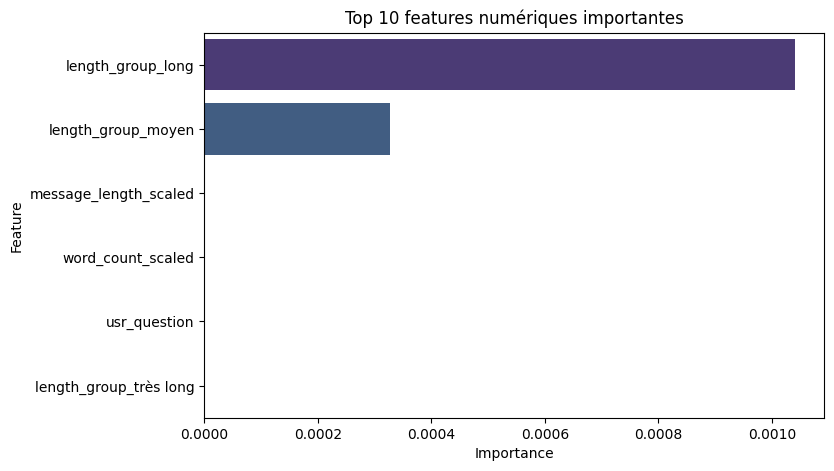

In [13]:
# =========================================================
# AUGESC — Exploration & Modèle + Visualisation
# =========================================================

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from sklearn.feature_extraction.text import TfidfVectorizer

from xgboost import XGBClassifier
from scipy.sparse import hstack

# -------------------------
# 1. Charger les données
# -------------------------
df = pd.read_csv("augesc_events_clean.csv")

# -------------------------
# 2. Visualisation / Nettoyage
# -------------------------
# 2.1 Distribution longueur messages
plt.figure(figsize=(10,5))
sns.histplot(df['message_length'], bins=50, kde=True, color='skyblue')
plt.title("Distribution de la longueur des messages")
plt.xlabel("message_length")
plt.ylabel("Nombre de messages")
plt.show()

# 2.2 Nombre de mots
plt.figure(figsize=(10,5))
sns.histplot(df['message'].str.split().apply(len), bins=50, kde=True, color='orange')
plt.title("Distribution du nombre de mots par message")
plt.xlabel("Nombre de mots")
plt.ylabel("Nombre de messages")
plt.show()

# 2.3 Répartition des questions vs affirmations
plt.figure(figsize=(6,4))
sns.countplot(x='is_question', data=df, palette='viridis')
plt.title("Répartition des messages : Question / Non-question")
plt.show()

# 2.4 Répartition par longueur (length_group)
plt.figure(figsize=(8,4))
sns.countplot(x='length_group', data=df, palette='magma')
plt.title("Répartition des messages par length_group")
plt.show()

# -------------------------
# 3. Préparation features pour ML
# -------------------------
df["is_question_binary"] = df["is_question"].astype(int)
y = df["is_question_binary"].values

df["word_count"] = df["message"].astype(str).str.split().apply(len)
df["usr_question"] = ((df["speaker"]=="usr") & df["is_question"]).astype(int)

scaler = StandardScaler()
df[["message_length_scaled","word_count_scaled"]] = scaler.fit_transform(df[["message_length","word_count"]])

length_dummies = pd.get_dummies(df["length_group"], prefix="length_group", drop_first=True)
df_model_numeric = pd.concat([
    df[["message_length_scaled","word_count_scaled","usr_question"]].astype(float),
    length_dummies.astype(float)
], axis=1)

tfidf = TfidfVectorizer(max_features=1000, ngram_range=(1,2), stop_words="english")
X_text = tfidf.fit_transform(df["message"])

X = hstack([X_text, df_model_numeric.values])

# -------------------------
# 4. Split train/test
# -------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# -------------------------
# 5. Modèle XGBoost
# -------------------------
pos_weight = np.sum(y_train==0)/np.sum(y_train==1)

model = XGBClassifier(
    n_estimators=200,
    max_depth=5,
    learning_rate=0.1,
    eval_metric='logloss',
    scale_pos_weight=pos_weight,
    random_state=42
)
model.fit(X_train, y_train)

# -------------------------
# 6. Prédictions
# -------------------------
y_pred = model.predict(X_test)
y_proba = model.predict_proba(X_test)[:,1]

# -------------------------
# 7. Évaluation
# -------------------------
print("=== Classification Report ===")
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
auc = roc_auc_score(y_test, y_proba)

print(f"Matrice de confusion :\n{cm}")
print(f"AUC: {auc:.3f}")

# 7.1 Matrice de confusion visuelle
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=[0,1], yticklabels=[0,1])
plt.xlabel("Prédit")
plt.ylabel("Réel")
plt.title("Matrice de confusion - is_question")
plt.show()

# -------------------------
# 8. Importance des features
# -------------------------
importances = model.feature_importances_
indices = np.argsort(importances)[::-1]

# Top 10 features numériques
feature_names_numeric = list(df_model_numeric.columns)
top_features = [(feature_names_numeric[i], importances[i]) for i in range(len(feature_names_numeric))]
top_features_sorted = sorted(top_features, key=lambda x: x[1], reverse=True)[:10]

print("\nTop 10 features numériques importantes :")
for name, imp in top_features_sorted:
    print(f"{name} -> {imp:.4f}")

# 8.1 Visualisation importance features
names = [name for name, _ in top_features_sorted]
values = [imp for _, imp in top_features_sorted]

plt.figure(figsize=(8,5))
sns.barplot(x=values, y=names, palette='viridis')
plt.title("Top 10 features numériques importantes")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.show()
